In [26]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [27]:
class YOLODataset(Dataset):
    def __init__(self, images_dir, labels_dir, transform=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(images_dir) if f.endswith('.JPG')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_filename = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_filename)
        label_path = os.path.join(self.labels_dir, os.path.splitext(img_filename)[0] + '.txt')

        # Load image
        image = Image.open(img_path).convert("RGB")
        width, height = image.size

        # Load annotations
        boxes = []
        labels = []

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue
                    class_id, cx, cy, w, h = map(float, parts)
                    # Convert YOLO format to (x_min, y_min, x_max, y_max)
                    x_min = (cx - w/2) * width
                    y_min = (cy - h/2) * height
                    x_max = (cx + w/2) * width
                    y_max = (cy + h/2) * height
                    boxes.append([x_min, y_min, x_max, y_max])
                    # labels.append(int(class_id))
                    labels.append(1)

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels
        }

        if self.transform:
            image = self.transform(image)

        return image, target


In [28]:
# mean = [0.485, 0.456, 0.406]
# std = [0.229, 0.224, 0.225]

In [29]:
input_transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize(mean=mean, std=std),
])

In [30]:
image_folder = 'cars-object-detection/train/train/images/'
target_folder = 'cars-object-detection/train/train/labels/'

In [31]:
train_set = YOLODataset(images_dir=image_folder, labels_dir=target_folder, transform=input_transform)

In [32]:
def collate_fn(batch):
    images = []
    targets = []

    for img, target in batch:
        images.append(img)
        targets.append(target)

    images = torch.stack(images, dim=0)
    return images, targets

In [33]:
train_loader = DataLoader(
    train_set,
    batch_size=2,
    shuffle=True,
    collate_fn=collate_fn
)

Faster R-CNN with a ResNet50 backbone

In [34]:
model = fasterrcnn_resnet50_fpn_v2(weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT)

num_classes = 2  # car + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
model.roi_heads.detections_per_img = 200

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to C:\Users\70p6229/.cache\torch\hub\checkpoints\fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100.0%


In [35]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

num_epochs = 10
model.train()

for epoch in range(num_epochs):
    losses_epoch = 0
    for imgs, targets in train_loader:
        imgs = list(img.to(device) for img in imgs)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    
        losses_epoch += losses

    print(f"Epoch {epoch+1}, Loss: {losses_epoch:.4f}")

Epoch 1, Loss: 103.7865
Epoch 2, Loss: 72.9727
Epoch 3, Loss: 62.2644
Epoch 4, Loss: 56.3742
Epoch 5, Loss: 52.4053
Epoch 6, Loss: 48.1661
Epoch 7, Loss: 44.5163
Epoch 8, Loss: 42.6225
Epoch 9, Loss: 40.4140
Epoch 10, Loss: 39.0629


In [36]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [37]:
def box_iou(boxes1, boxes2):
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    lt = torch.max(boxes1[:, None, :2], boxes2[:, :2])  # left-top
    rb = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])  # right-bottom

    wh = (rb - lt).clamp(min=0)
    inter = wh[:, :, 0] * wh[:, :, 1]

    union = area1[:, None] + area2 - inter
    iou = inter / (union + 1e-6)
    return iou

In [38]:
def draw_boxes(ax, boxes, labels, scores=None, color='lime', score_threshold=0.0):
    for i, box in enumerate(boxes):
        if scores is not None and scores[i] < score_threshold:
            continue

        x1, y1, x2, y2 = box.tolist()
        label = labels[i] - 1 # included background label at index 0
        name = "car"
        score_text = f"{name}: {scores[i]:.2f}" if scores is not None else name

        ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                       linewidth=2, edgecolor=color, facecolor='none'))
        ax.text(x1, y1 - 5, score_text, fontsize=10, color='black',
                bbox=dict(facecolor=color, alpha=0.5, pad=2))

In [39]:
# def unnormalize(image, mean, std):
#     """
#     Undo normalization on an image tensor.
    
#     image: tensor [C, H, W]
#     mean: list of means per channel
#     std: list of stds per channel
#     returns: unnormalized image tensor
#     """
#     for t, m, s in zip(image, mean, std):
#         t.mul_(s).add_(m)
#     return image

In [40]:
def plot_predictions_vs_targets(img_tensor, prediction, target, score_threshold=0.5):
    # img_tensor = unnormalize(img_tensor, mean, std)
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    img = (img * 255).astype(np.uint8)

    fig, (ax_pred, ax_gt) = plt.subplots(1, 2, figsize=(16, 8))
    fig.suptitle("Predictions vs Ground Truth", fontsize=16)

    # predictions
    ax_pred.imshow(img)
    ax_pred.set_title("Predicted")
    draw_boxes(ax_pred, prediction['boxes'].cpu(), prediction['labels'].cpu(), scores=prediction['scores'].cpu(), color='lime', score_threshold=score_threshold)
    ax_pred.axis("off")

    # ground truth
    ax_gt.imshow(img)
    ax_gt.set_title("Ground Truth")
    draw_boxes(ax_gt, target['boxes'].cpu(), target['labels'].cpu(), color='cyan')
    ax_gt.axis("off")

    # IoU calculations
    pred_boxes = prediction['boxes'].cpu()
    pred_labels = prediction['labels'].cpu()
    pred_scores = prediction['scores'].cpu()

    gt_boxes = target['boxes'].cpu()
    gt_labels = target['labels'].cpu()

    if len(pred_boxes) > 0 and len(gt_boxes) > 0:
        ious = box_iou(pred_boxes, gt_boxes)
        best_ious = ious.max(dim=1).values
        valid = pred_scores > score_threshold
        mean_iou = best_ious[valid].mean().item() if valid.any() else 0.0
        iou_text = f"Mean IoU (pred→gt): {mean_iou:.3f} over {valid.sum().item()} boxes"
    else:
        iou_text = "No predictions or ground truth boxes to compute IoU."

    # display IoU info
    fig.subplots_adjust(bottom=0.15)
    fig.text(0.5, 0.01, iou_text, ha='center', fontsize=12)

    plt.tight_layout()
    plt.show()

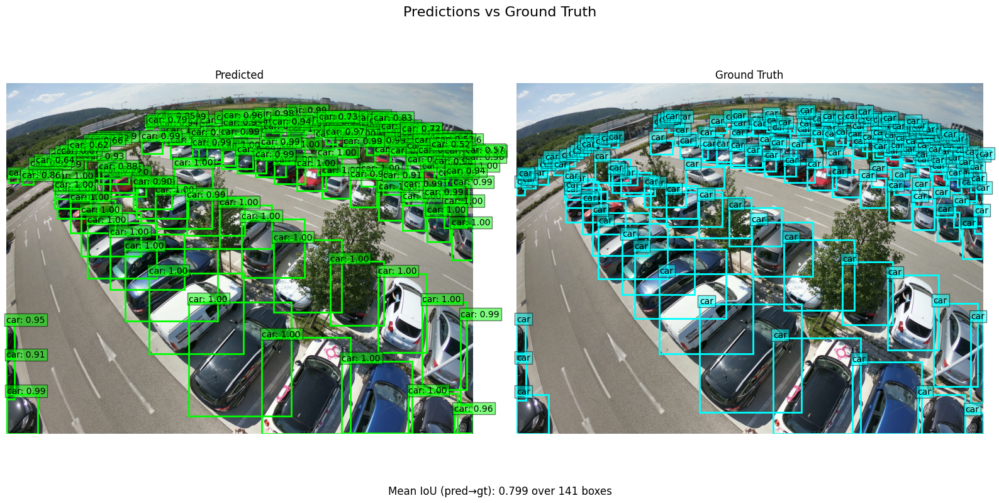

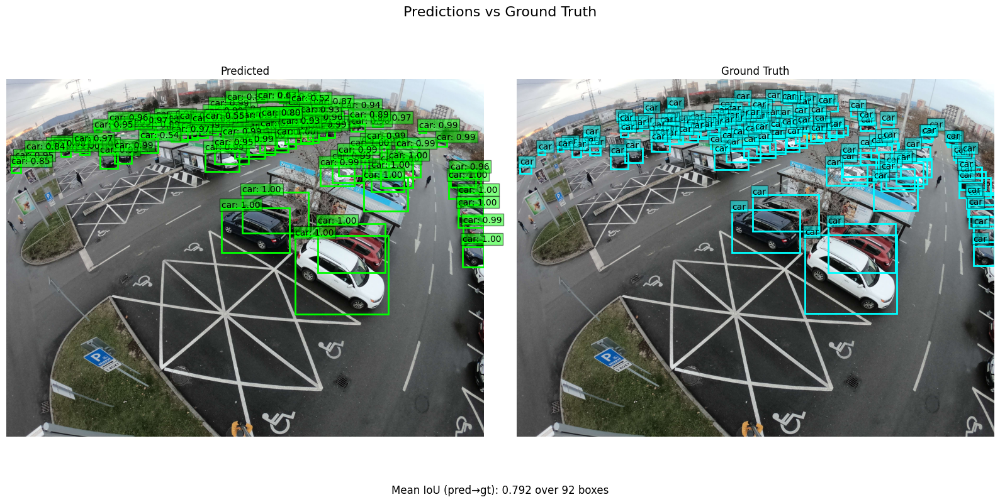

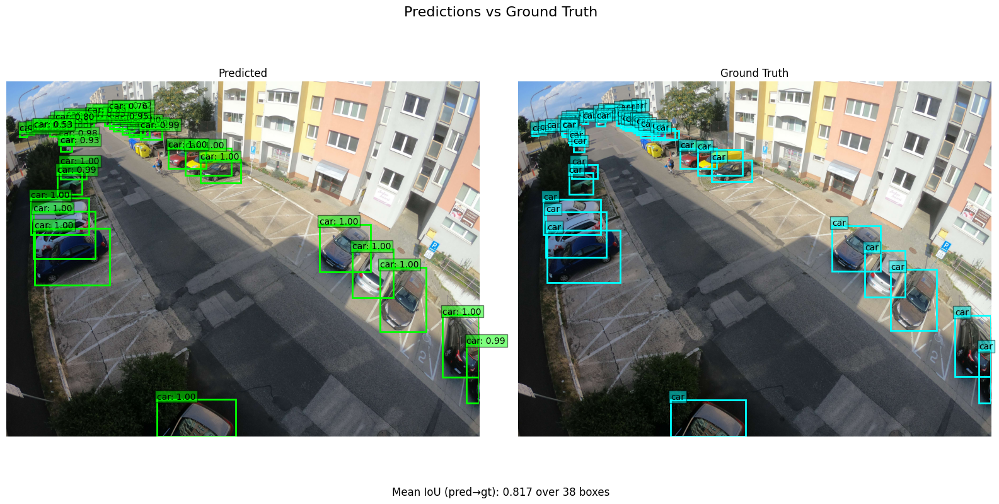

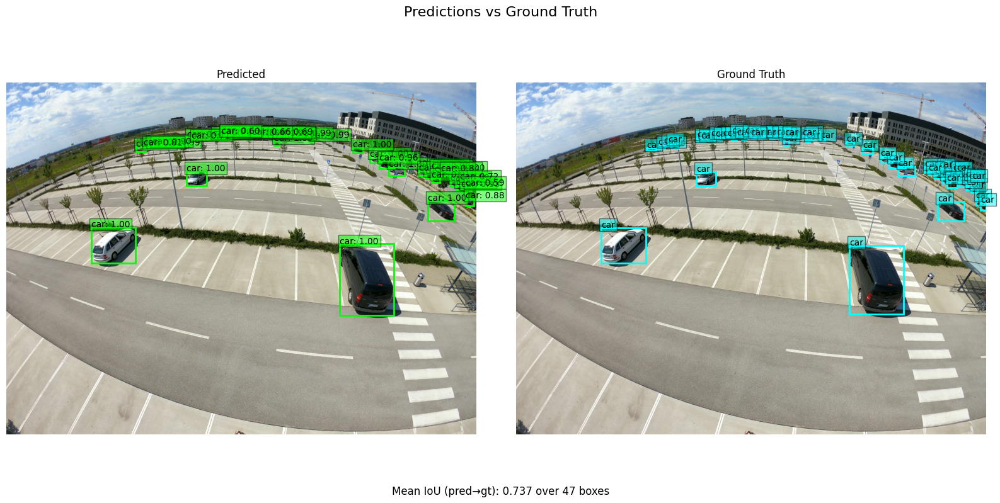

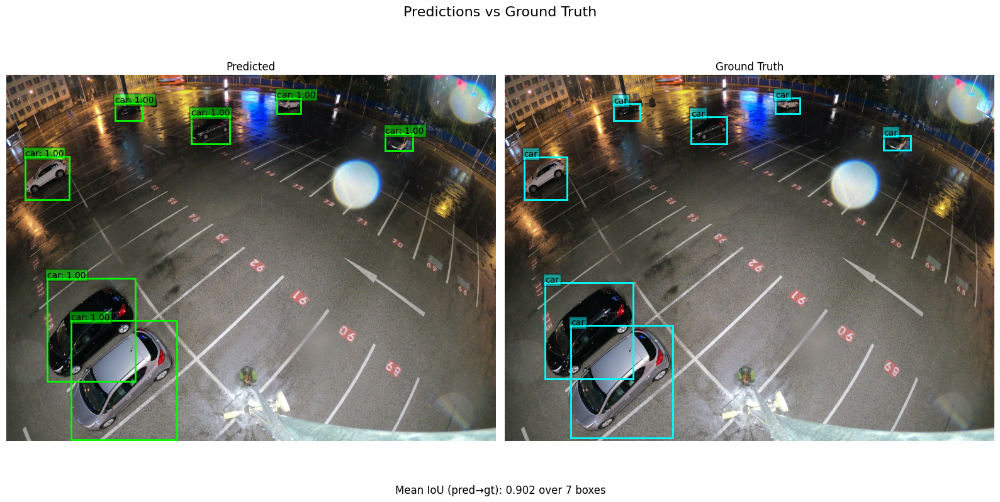

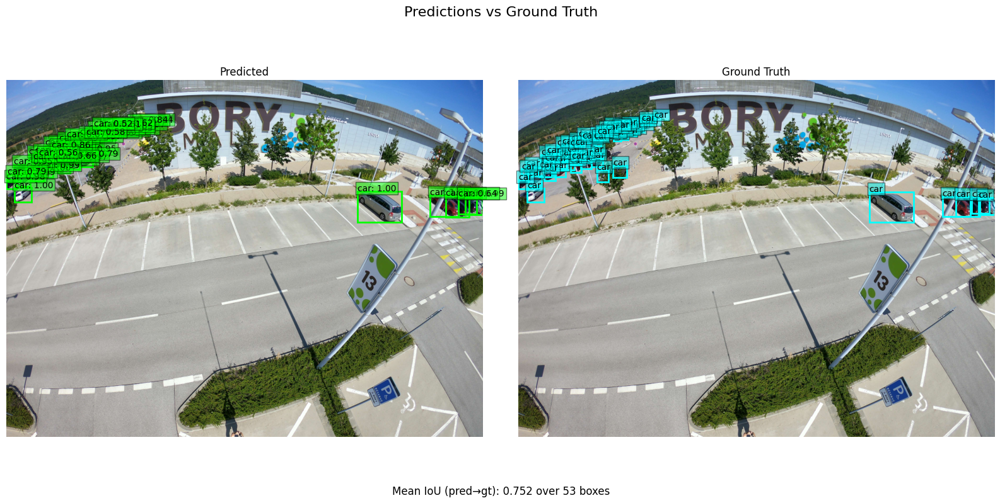

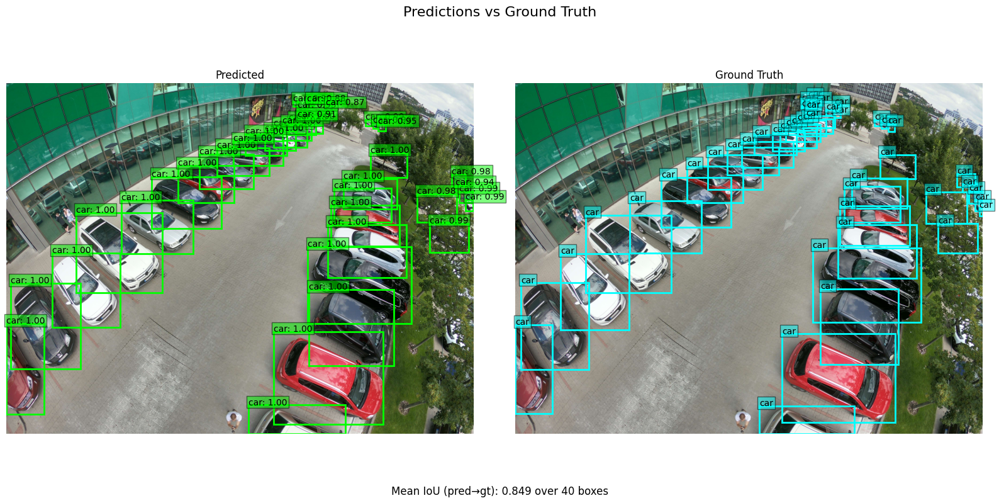

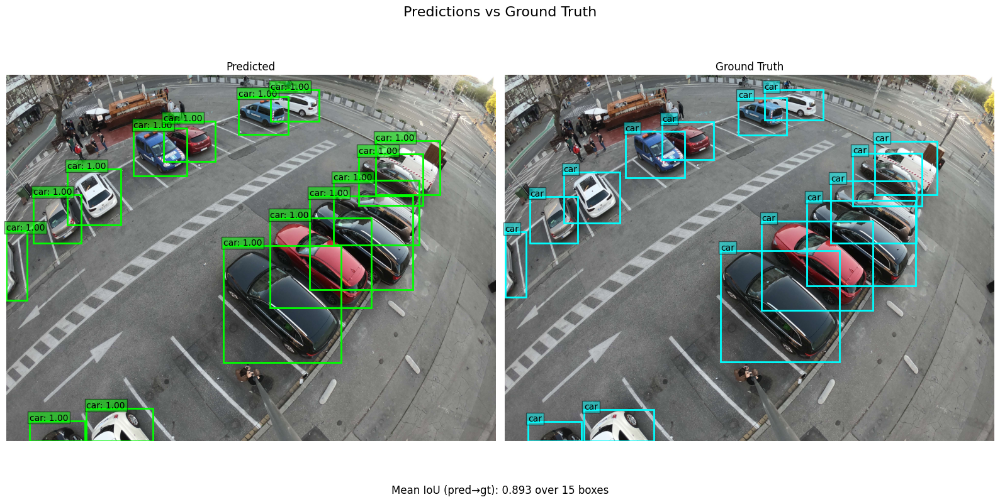

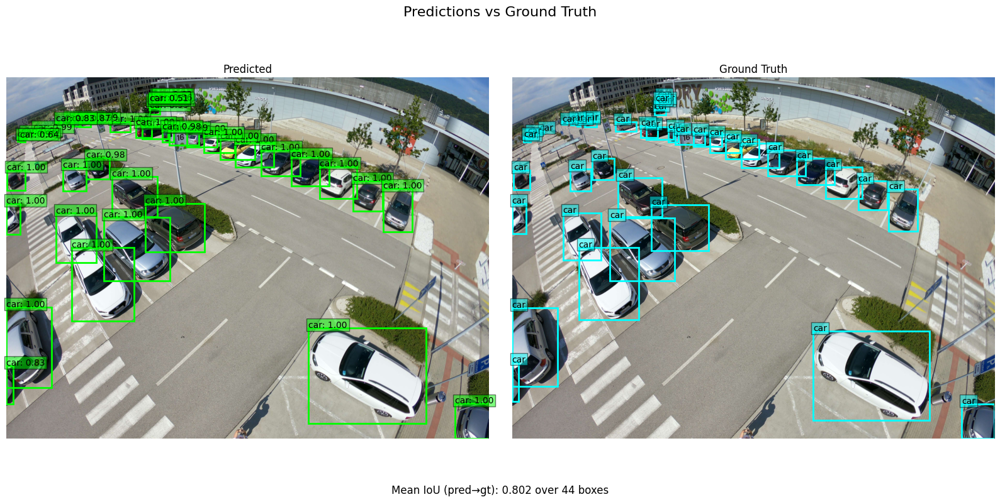

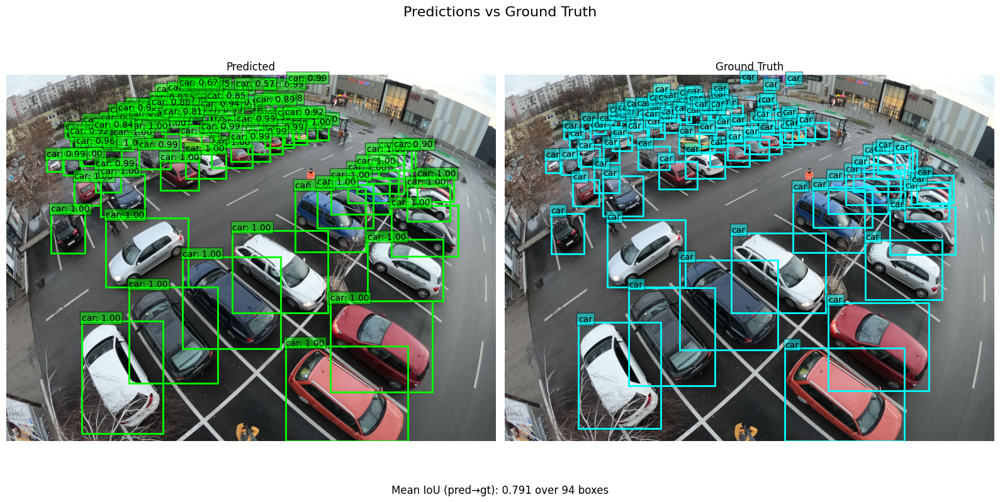

In [41]:
for i in range(10):
    img, target = train_set[i]
    img = img.to(device)
    with torch.no_grad():
        prediction = model([img])[0]
    plot_predictions_vs_targets(img, prediction, target)

In [42]:
preds = []
targets = []

for img, target in train_set:
    img = img.to(device)
    targets.append(target)

    with torch.no_grad():
        preds.append(model([img]))

IoU calculations

In [43]:
iou_sum = 0

for i in range(len(preds)):
    pred_boxes = preds[i][0]['boxes'].cpu()
    pred_scores = preds[i][0]['scores'].cpu()

    gt_boxes = targets[i]['boxes'].cpu()

    if len(pred_boxes) > 0 and len(gt_boxes) > 0:
        ious = box_iou(pred_boxes, gt_boxes)
        best_ious = ious.max(dim=1).values
        valid = pred_scores > 0.5
        mean_iou = best_ious[valid].mean().item() if valid.any() else 0.0
        iou_sum += mean_iou

iou = iou_sum / len(preds)

In [44]:
iou

0.8368438033976107

In [45]:
def xyxy_to_yolo(box, img_width, img_height):
    x_min, y_min, x_max, y_max = box

    box_width = x_max - x_min
    box_height = y_max - y_min
    center_x = x_min + box_width / 2
    center_y = y_min + box_height / 2

    # Normalize
    center_x /= img_width
    center_y /= img_height
    box_width /= img_width
    box_height /= img_height

    return [center_x, center_y, box_width, box_height]

In [46]:
test_image_folder = 'cars-object-detection/test/test/images/'

test_set = YOLODataset(images_dir=test_image_folder, labels_dir=target_folder, transform=input_transform)

ids = []
test_scores = []
test_boxes = []
for i, (img, _) in enumerate(test_set):
    ids.append(test_set.image_files[i].split('.')[0])
    img = img.to(device)
    with torch.no_grad():
        test_scores.append(model([img])[0]['scores'].cpu().numpy())
        test_boxes.append([xyxy_to_yolo(box, 4000, 3000) for box in model([img])[0]['boxes'].cpu().numpy()])

In [47]:
pred_list = []
for i in range(len(test_scores)):
    row = []
    for j in range(len(test_scores[i])):
        row += [0, test_scores[i][j], test_boxes[i][j][0], test_boxes[i][j][1], test_boxes[i][j][2], test_boxes[i][j][3]]
    pred_list.append(row)

In [48]:
submission_df = pd.DataFrame({'id': ids, 'predictions': pred_list})

In [49]:
submission_df.to_csv('submission.csv', index=False)

In [50]:
submission_df

,id,predictions
0,024cfeb7-GOPR6549,"[0, 0.9995741, 0.7184098510742187, 0.678154805..."
1,0635aa25-GOPR6590,"[0, 0.99963176, 0.40365370178222654, 0.6742484..."
2,06a132db-GOPR6571,"[0, 0.9997476, 0.2134014892578125, 0.350344624..."
3,0758bd59-GOPR6699,"[0, 0.99955434, 0.6968564147949219, 0.20514742..."
4,0e8671d1-GOPR6626,"[0, 0.99922454, 0.7751203308105469, 0.42892523..."
5,138396e0-GOPR6738,"[0, 0.9989801, 0.2856154861450195, 0.386191874..."
6,15498cfb-GOPR6614,"[0, 0.99912804, 0.3363450927734375, 0.44837723..."
7,19dec389-GOPR0037,"[0, 0.99959844, 0.23861952209472656, 0.2238143..."
8,1cf3c7af-GOPR6787,"[0, 0.9994814, 0.6365036010742188, 0.368079620..."
9,1f116d33-GOPR6753,"[0, 0.9992347, 0.37295736694335935, 0.29079801..."
